In [1]:
import plotly as py
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data_immobilier=pd.read_csv('avito_big_immobilier.csv')
data_informatique=pd.read_csv('avito_big_informatique.csv')
data_sevice=pd.read_csv('avito_big_service.csv')
data_vehicule=pd.read_csv('avito_big_vehicule.csv')
data_maison_jardin=pd.read_csv('avito_big_maison_jardin.csv')

In [3]:
data_immobilier['prix']=data_immobilier['prix'].str.replace(' ', '')
data_immobilier['prix']=data_immobilier['prix'].astype('float')
ranimm=data_immobilier.index

In [4]:
data_informatique['prix']=data_informatique['prix'].str.replace(' ', '')
data_informatique['prix']=data_informatique['prix'].astype('float')
raninfo=data_informatique.index

In [5]:
data_sevice['prix']=data_sevice['prix'].str.replace(' ', '')
data_sevice['prix']=data_sevice['prix'].astype('float')
ranserv=data_sevice.index

In [6]:
data_vehicule['prix']=data_vehicule['prix'].str.replace(' ', '')
data_vehicule['prix']=data_vehicule['prix'].astype('float')
ranvehi=data_vehicule.index

In [7]:
data_maison_jardin['prix']=data_maison_jardin['prix'].str.replace(' ', '')
data_maison_jardin['prix']=data_maison_jardin['prix'].astype('float')
ranmaisjar=data_maison_jardin.index

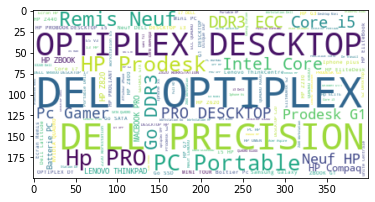

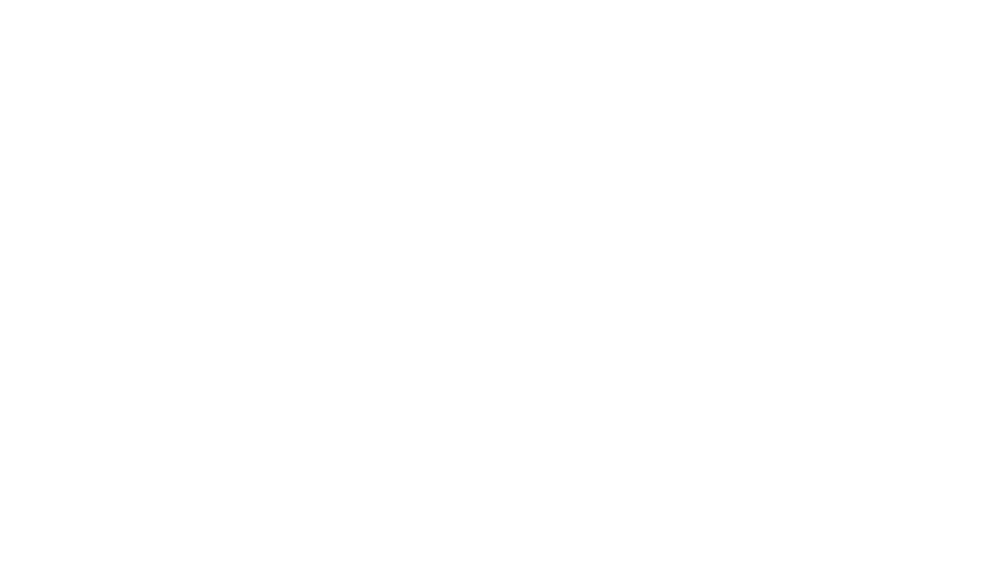

In [8]:
fig=(px.box(data_informatique, y="prix"))
fig.layout.update({'title': 'informatique'})
fig.show()
text=(list(data_informatique['nom']))
my = ''.join(map(str, text))
wordcloud=WordCloud(max_font_size=50, max_words=1000, background_color="white").generate(my)
plt.imshow(wordcloud, interpolation='bilinear')
plt.figure(figsize=[100,60])
plt.axis("off")
plt.show()

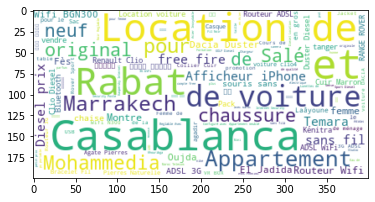

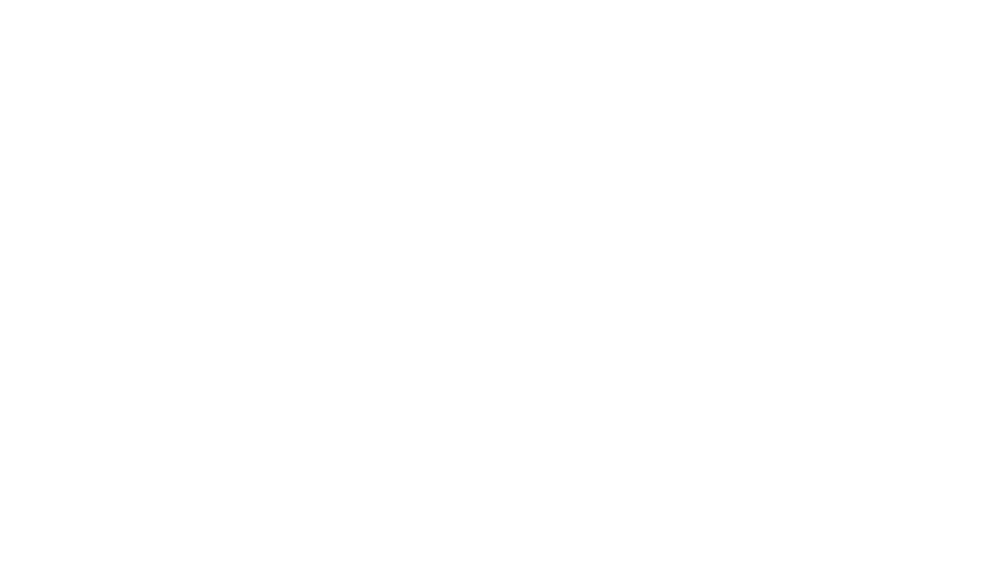

In [9]:
fig=px.box(data_sevice, y="prix")
fig.layout.update({'title': 'services'})
fig.show()
text=(list(data_sevice['nom']))
my = ''.join(map(str, text))
wordcloud=WordCloud(max_font_size=50, max_words=1000, background_color="white").generate(my)
plt.imshow(wordcloud, interpolation='bilinear')
plt.figure(figsize=[100,60])
plt.axis("off")
plt.show()

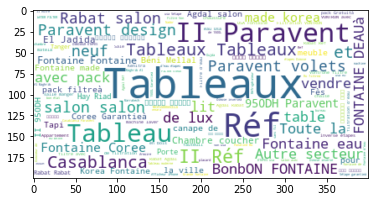

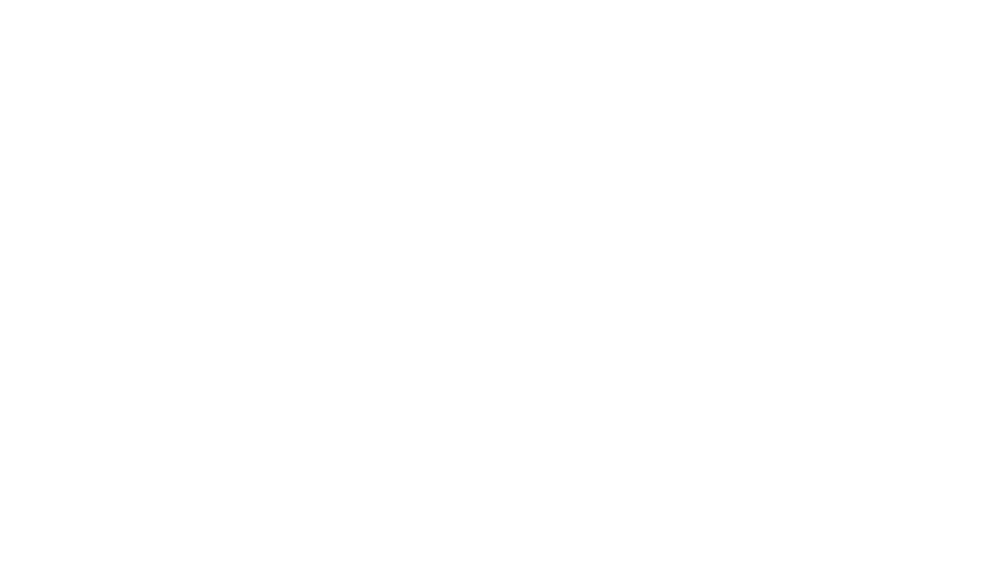

In [10]:
fig=(px.box(data_maison_jardin, y="prix"))
fig.layout.update({'title': 'maison et jardin'})
fig.show()
text=(list(data_maison_jardin['nom']))
my = ''.join(map(str, text))
wordcloud=WordCloud(max_font_size=50, max_words=1000, background_color="white").generate(my)
plt.imshow(wordcloud, interpolation='bilinear')
plt.figure(figsize=[100,60])
plt.axis("off")
plt.show()

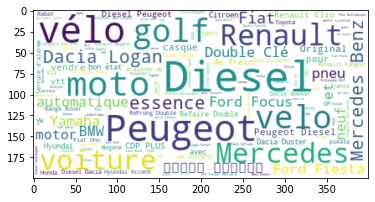

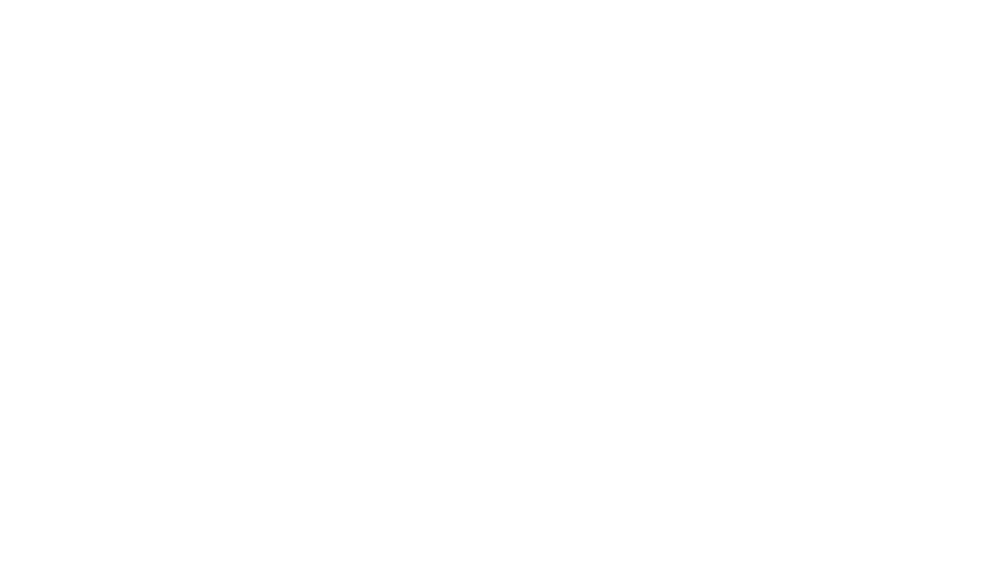

In [11]:
fig=(px.box(data_vehicule, y="prix"))
fig.layout.update({'title': 'vehicule'})
fig.show()
text=(list(data_vehicule['nom']))
my = ''.join(map(str, text))
wordcloud=WordCloud(max_font_size=50, max_words=1000, background_color="white").generate(my)
plt.imshow(wordcloud, interpolation='bilinear')
plt.figure(figsize=[100,60])
plt.axis("off")
plt.show()

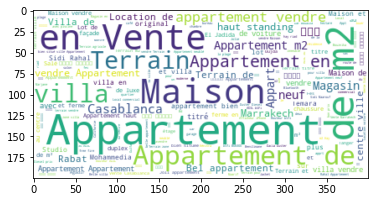

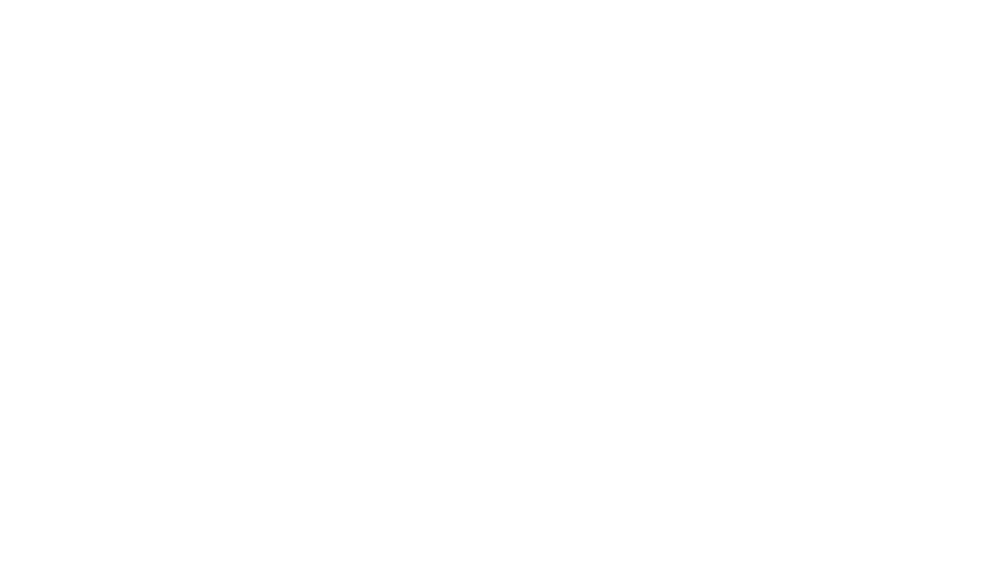

In [12]:
fig=(px.box(data_immobilier, y="prix"))
fig.layout.update({'title': 'immobilier'})
fig.show()
text=(list(data_immobilier['nom']))
my = ''.join(map(str, text))
wordcloud=WordCloud(max_font_size=50, max_words=1000, background_color="white").generate(my)
plt.imshow(wordcloud, interpolation='bilinear')
plt.figure(figsize=[100,60])
plt.axis("off")
plt.show()

In [13]:
df=data_immobilier
s=set(df['date'])
Mths=['Jan','Fév','Mar','Avr','Mai','Juin','Juil','Aoû','Oct','Sept','Nov','Déc']
l=list(s)
L=[]
for i in s :
    if len(i)==len('1 Déc') :
        if (i[2:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[2:])<9 :
                L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :   L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])
        else :
             L.append('2020/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
    elif len(i)==len('11 Mar') and i[1]!=' ':
        if (i[3:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else :   L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])
        else :
             L.append('2020/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
    elif len(i)==len('2 Sept') and i[1]==' ':
            if Mths.index(i[2:])<9 :  L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])    
    elif i not in ['Hier','Aujourd\'hui']:
        try:
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else:  L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
        except :
            print(i)
            break
            
#creation de dataframe organise selon la datte :
for i in range(len(L)):
    df['date'].loc[df['date']==l[i]]=L[i]

dimm_prix=df.groupby(['date']).sum()
#dessiner pie chart :
fig = px.pie(df, values='prix', names='date', title='chiffre d\'affaire ')
fig.show()


#dessiner une graphe :
fig=go.Figure()
fig.add_trace(go.Scatter(x=dimm_prix.index, y=dimm_prix['prix'],
        mode='lines+markers',
        name='chiffre d\'affaire en fonction de temps '))
fig.show()

C:\Users\mouad\Anaconda3\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [14]:
df=data_informatique
s=set(df['date'])
Mths=['Jan','Fév','Mar','Avr','Mai','Juin','Juil','Aoû','Oct','Sept','Nov','Déc']
l=list(s)
L=[]
for i in s :
    if len(i)==len('1 Déc') :
        if (i[2:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[2:])<9 :
                L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :   L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])
        else :
             L.append('2020/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
    elif len(i)==len('11 Mar') and i[1]!=' ':
        if (i[3:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else :   L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])
        else :
             L.append('2020/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
    elif len(i)==len('2 Sept') and i[1]==' ':
            if Mths.index(i[2:])<9 :  L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])    
    elif i not in ['Hier','Aujourd\'hui']:
        try:
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else:  L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
        except :
            print(i)
            break
            
#creation de dataframe organise selon la datte :
for i in range(len(L)):
    df['date'].loc[df['date']==l[i]]=L[i]

dimm_prix=df.groupby(['date']).sum()
#dessiner pie chart :
fig = px.pie(df, values='prix', names='date', title='chiffre d\'affaire ')
fig.show()


#dessiner une graphe :
fig=go.Figure()
fig.add_trace(go.Scatter(x=dimm_prix.index, y=dimm_prix['prix'],
        mode='lines+markers',
        name='chiffre d\'affaire en fonction de temps '))
fig.show()

In [15]:
df=data_sevice
s=set(df['date'])
Mths=['Jan','Fév','Mar','Avr','Mai','Juin','Juil','Aoû','Oct','Sept','Nov','Déc']
l=list(s)
L=[]
for i in s :
    if len(i)==len('1 Déc') :
        if (i[2:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[2:])<9 :
                L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :   L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])
        else :
             L.append('2020/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
    elif len(i)==len('11 Mar') and i[1]!=' ':
        if (i[3:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else :   L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])
        else :
             L.append('2020/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
    elif len(i)==len('2 Sept') and i[1]==' ':
            if Mths.index(i[2:])<9 :  L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])    
    elif i not in ['Hier','Aujourd\'hui']:
        try:
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else:  L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
        except :
            print(i)
            break
            
#creation de dataframe organise selon la datte :
for i in range(len(L)):
    df['date'].loc[df['date']==l[i]]=L[i]

dimm_prix=df.groupby(['date']).sum()
#dessiner pie chart :
fig = px.pie(df, values='prix', names='date', title='chiffre d\'affaire ')
fig.show()


#dessiner une graphe :
fig=go.Figure()
fig.add_trace(go.Scatter(x=dimm_prix.index, y=dimm_prix['prix'],
        mode='lines+markers',
        name='chiffre d\'affaire en fonction de temps '))
fig.show()

In [16]:
df=data_vehicule
s=set(df['date'])
Mths=['Jan','Fév','Mar','Avr','Mai','Juin','Juil','Aoû','Oct','Sept','Nov','Déc']
l=list(s)
L=[]
for i in s :
    if len(i)==len('1 Déc') :
        if (i[2:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[2:])<9 :
                L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :   L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])
        else :
             L.append('2020/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
    elif len(i)==len('11 Mar') and i[1]!=' ':
        if (i[3:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else :   L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])
        else :
             L.append('2020/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
    elif len(i)==len('2 Sept') and i[1]==' ':
            if Mths.index(i[2:])<9 :  L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])    
    elif i not in ['Hier','Aujourd\'hui']:
        try:
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else:  L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
        except :
            print(i)
            break
            
#creation de dataframe organise selon la datte :
for i in range(len(L)):
    df['date'].loc[df['date']==l[i]]=L[i]

dimm_prix=df.groupby(['date']).sum()
#dessiner pie chart :
fig = px.pie(df, values='prix', names='date', title='chiffre d\'affaire ')
fig.show()


#dessiner une graphe :
fig=go.Figure()
fig.add_trace(go.Scatter(x=dimm_prix.index, y=dimm_prix['prix'],
        mode='lines+markers',
        name='chiffre d\'affaire en fonction de temps '))
fig.show()

In [17]:
df=data_maison_jardin
s=set(df['date'])
Mths=['Jan','Fév','Mar','Avr','Mai','Juin','Juil','Aoû','Oct','Sept','Nov','Déc']
l=list(s)
L=[]
for i in s :
    if len(i)==len('1 Déc') :
        if (i[2:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[2:])<9 :
                L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :   L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])
        else :
             L.append('2020/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
    elif len(i)==len('11 Mar') and i[1]!=' ':
        if (i[3:] not in ['Jan','Fév','Mar']):
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else :   L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])
        else :
             L.append('2020/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
    elif len(i)==len('2 Sept') and i[1]==' ':
            if Mths.index(i[2:])<9 :  L.append('2019/0'+str(Mths.index(i[2:])+1)+'/0'+i[0])
            else :L.append('2019/'+str(Mths.index(i[2:])+1)+'/0'+i[0])    
    elif i not in ['Hier','Aujourd\'hui']:
        try:
            if Mths.index(i[3:])<9 :
                L.append('2019/0'+str(Mths.index(i[3:])+1)+'/'+i[:2])
            else:  L.append('2019/'+str(Mths.index(i[3:])+1)+'/'+i[:2])  
        except :
            print(i)
            break
            
#creation de dataframe organise selon la datte :
for i in range(len(L)):
    df['date'].loc[df['date']==l[i]]=L[i]

dimm_prix=df.groupby(['date']).sum()
#dessiner pie chart :
fig = px.pie(df, values='prix', names='date', title='chiffre d\'affaire ')
fig.show()


#dessiner une graphe :
fig=go.Figure()
fig.add_trace(go.Scatter(x=dimm_prix.index, y=dimm_prix['prix'],
        mode='lines+markers',
        name='chiffre d\'affaire en fonction de temps '))
fig.show()